# Recombination sweep — methods comparison

Standalone notebook for the Tier 9 recomb-sweep results. Loads the
consolidated parquet dataset at `results/session_summary/` covering 4 regimes (3 equal-pool + 1 skewed-pool stress test).
Independent of the older simulation tiers (those live in `SIMULATION_RESULTS.ipynb`).

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

---
## Tier 9 — Recombination sweep: AF + identity, all methods (this session)

Three regimes from `pool_sweep_82_recomb` (Chr1, cov=50, hotspot recomb):
- **n200_g1**: 200 founders, 1 generation of recomb (high diversity)
- **n50_g1**: 50 founders, 1 gen (moderate)
- **n50_g3**: 50 founders, 3 gens (low diversity / strong fine-block structure — hardest)

Truth from `ancestry.tsv` × `cn_var_231_v2`. Methods scored on 410k–760k polymorphic Chr1 records per regime.

### Method summary (one row per method)

| Method | Evidence | Resolution | Block model | EM space |
|--------|----------|-------------|--------------|------------|
| **hapfire_coarse** | read-level SNPs (HARP) | ~30 coarse LD blocks | yes | per-coarse-block + analytical projection to fine |
| **hapfire_fine** | read-level SNPs (HARP) | BigLD ~7 kb | yes | per-fine-block, group-size-corrected projection |
| **bigld_panel** | bubble-allele k-mers (PanGenie) | BigLD fine block | yes | 231-founder simplex per block |
| **clean_cc5** | block-haplotype k-mers (full-block reconstruction, cc≥5 dedup) | BigLD fine block | yes | unique-haplotype-class simplex per block, scattered to 231 founders |
| **clean_smooth** | clean_cc5 + Li-Stephens HMM smoothing across blocks (passes=10, α=0.2) | BigLD fine block | yes (+smoothing) | same as clean_cc5 |
| **dose_aware** | clean_cc5 with k-mer multiplicity (`cn[c, k]` = count) | BigLD fine block | yes | same as clean_cc5 |
| **hybrid** | union of clean_cc5 block k-mers + PanGenie bubble-allele k-mers | BigLD fine block | yes | per-block (founder-level) |
| **global** | block-haplotype k-mers, no LD partition | whole chrom | no | single chrom-wide h |
| **window** | block-haplotype k-mers, fixed 200-kb windows | 200-kb window | yes (fixed) | per-window h |

**freqk** was attempted but uses the cactus pangenome decomposed VCF as panel; the recomb sims use the imputed Beagle merged VCF (`cn_var_231_v2`). 0 founder overlap, 0 record overlap — comparison would require rebuilding freqk's index on `merged_v2_chr.vcf.gz`. Flagged in `MODEL_SPEC.md` § Future work.

In [2]:
RESULTS_DIR = Path('/carnegie/nobackup/scratch/tbellagio/hapfire_sv/results/session_summary')
af_long = pd.read_parquet(RESULTS_DIR / 'af_long.parquet')
af_summary = pd.read_parquet(RESULTS_DIR / 'af_summary.parquet')
ident = pd.read_parquet(RESULTS_DIR / 'identity_metrics.parquet')

# Slim: keep only the methods we want to compare (set in stone for this notebook).
# 2026-05-06 additions (Route 1 anchor + Route 2 overlap + Route 3 kallisto + post-EM smoothing):
#   kallisto_em — read-level pseudoalignment + EC-multinomial EM at 10 kb (Route 3, FAILED)
#   window_10kb_anchor{0.1,0.2,0.3,0.5,1.0} — Route 1 (global-anchor KL prior) sweep
#   window_5kb_anchor0.3, window_3kb_anchor0.3 — smaller windows (slightly worse)
#   window_10kb_step{5kb,3kb}_anchor0.3 — Route 1 + Route 2 (overlapping, neutral)
#   window_10kb_anchor0.3_smooth{5a05,10a02,20a01} — Route 1 + post-EM HMM smoothing (BEST)
_KEEP = ['hapfire_coarse', 'hapfire_fine',
         'hapfire_win10kb', 'hapfire_win100kb',
         'global', 'window_10kb',
         'window_10kb_anchor0.1', 'window_10kb_anchor0.2', 'window_10kb_anchor0.3',
         'window_10kb_anchor0.5', 'window_10kb_anchor1.0',
         'window_5kb_anchor0.3', 'window_3kb_anchor0.3',
         'window_10kb_step5kb_anchor0.3', 'window_10kb_step3kb_anchor0.3',
         'window_10kb_anchor0.3_smooth5a05',
         'window_10kb_anchor0.3_smooth10a02',
         'window_10kb_anchor0.3_smooth20a01',
         'window_100kb', 'window',
         'kallisto_em']
af_long = af_long[af_long.method.isin(_KEEP)].reset_index(drop=True)
af_summary = af_summary[af_summary.method.isin(_KEEP)].reset_index(drop=True)
ident = ident[ident.method.isin(_KEEP)].reset_index(drop=True) if 'method' in ident.columns else ident

REGIME_ORDER = ['n200_g1', 'n50_g1', 'n50_g3', 'n50_g3_skewed']
METHOD_ORDER = _KEEP
MAIN_METHODS = _KEEP

print(f'af_long: {len(af_long):,} rows')
print(f'af_summary: {len(af_summary):,} rows')
print(f'ident: {len(ident):,} rows')
print(f'methods present: {sorted(af_long.method.unique())}')
print(f'regimes present: {sorted(af_long.regime.unique())}')

# Quick coverage matrix: which methods have results in which regimes?
print()
print('=== METHOD × REGIME COVERAGE (rows in af_long) ===')
cov = af_long.groupby(['method','regime']).size().unstack(fill_value=0)
print(cov.reindex(METHOD_ORDER).reindex(columns=REGIME_ORDER).fillna(0).astype(int).to_string())

af_long: 30,416,670 rows
af_summary: 702 rows
ident: 8 rows


methods present: ['global', 'hapfire_coarse', 'hapfire_fine', 'hapfire_win100kb', 'hapfire_win10kb', 'kallisto_em', 'window', 'window_100kb', 'window_10kb', 'window_10kb_anchor0.1', 'window_10kb_anchor0.2', 'window_10kb_anchor0.3', 'window_10kb_anchor0.3_smooth10a02', 'window_10kb_anchor0.3_smooth20a01', 'window_10kb_anchor0.3_smooth5a05', 'window_10kb_anchor0.5', 'window_10kb_anchor1.0', 'window_10kb_step3kb_anchor0.3', 'window_10kb_step5kb_anchor0.3', 'window_3kb_anchor0.3', 'window_5kb_anchor0.3']


regimes present: ['n200_g1', 'n50_g1', 'n50_g3', 'n50_g3_skewed']

=== METHOD × REGIME COVERAGE (rows in af_long) ===


regime                             n200_g1   n50_g1   n50_g3  n50_g3_skewed
method                                                                     
hapfire_coarse                      699182   458137   388636         388636
hapfire_fine                        699182   458137   388636         388636
hapfire_win10kb                     697138   457234   387963         387963
hapfire_win100kb                         0        0   388675         388675
global                              699485   458294   388756         388756
window_10kb                              0        0   388756         388756
window_10kb_anchor0.1               699485   458294   388756         388756
window_10kb_anchor0.2                    0        0   388756              0
window_10kb_anchor0.3               699485   458294   388756         388756
window_10kb_anchor0.5                    0        0   388756              0
window_10kb_anchor1.0               699485   458294   388756         388756
window_5kb_a

### Tier 9.1 — Headline AF accuracy: R² per regime × method × var_type

**Regimes:**
- `n200_g1`, `n50_g1`, `n50_g3`: equal-pool recomb (uniform 1/N pool fractions, ergodic per-position founder mix)
- `n50_g3_skewed`: 1 mosaic at 51%, 49 at ~1% each (breaks ergodicity by drift). Tests whether fine-block methods recover when global stops working.


In [3]:
headline = (af_summary[(af_summary.var_type.isin(['SNP', 'INS', 'DEL']))
                       & (af_summary.ld_tier == 'all')]
            .pivot_table(index=['regime'], columns=['method', 'var_type'], values='R2'))
headline = headline.reindex(REGIME_ORDER)
method_cols = [m for m in METHOD_ORDER if m in headline.columns.get_level_values(0)]
headline = headline.reindex(columns=pd.MultiIndex.from_product(
    [method_cols, ['SNP', 'INS', 'DEL']], names=['method', 'var_type']))
headline.style.background_gradient(cmap='RdYlGn', axis=1).format('{:.3f}', na_rep='—')

In [4]:
METHOD_ORDER = ['hapfire_coarse',
 'hapfire_fine',
 'hapfire_win10kb',
 'hapfire_win100kb',
 'global',
 'window_10kb',
 'window_10kb_anchor0.1',
 'window_10kb_anchor0.2',
 'window_10kb_anchor0.3',
 'window_10kb_anchor0.5',
 'window_10kb_anchor1.0',
 'window_5kb_anchor0.3',
 'window_3kb_anchor0.3',
 'window_10kb_step5kb_anchor0.3',
 'window_10kb_step3kb_anchor0.3',
 'window_10kb_anchor0.3_smooth5a05',
 'window_10kb_anchor0.3_smooth10a02',
 'window_10kb_anchor0.3_smooth20a01',
 'window_100kb',
 'window',
 'kallisto_em']

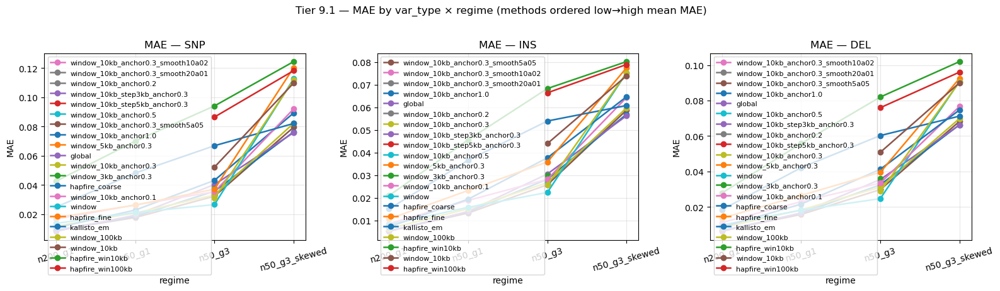

In [5]:
# MAE by var_type (SNP, INS, DEL) — line plot per regime; methods ordered low→high MAE within each panel
var_types = ['SNP', 'INS', 'DEL']
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5), sharex=False)
all_methods = [m for m in METHOD_ORDER if m in af_summary.method.unique()]
# Stable color per method across the 3 panels
import matplotlib.cm as cm
method_colors = {m: cm.tab10(i % 10) for i, m in enumerate(all_methods)}
for ax, vt in zip(axes, var_types):
    sub = (af_summary[(af_summary.var_type == vt) & (af_summary.ld_tier == 'all')]
           .pivot(index='regime', columns='method', values='MAE')
           .reindex(REGIME_ORDER))
    if not all(m in sub.columns for m in all_methods):
        sub = sub.reindex(columns=[m for m in all_methods if m in sub.columns])
    else:
        sub = sub.reindex(columns=all_methods)
    # Order methods by mean MAE across regimes (low to high)
    method_order_local = sub.mean(axis=0).sort_values().index.tolist()
    sub = sub[method_order_local]
    for m in method_order_local:
        ax.plot(REGIME_ORDER, sub[m].values, marker='o', lw=1.8, color=method_colors[m], label=m)
    ax.set_title(f'MAE — {vt}')
    ax.set_ylabel('MAE')
    ax.set_xlabel('regime')
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8, loc='best', frameon=True)
    for label in ax.get_xticklabels(): label.set_rotation(15)
fig.suptitle('Tier 9.1 — MAE by var_type × regime (methods ordered low→high mean MAE)', y=1.02)
fig.tight_layout(); plt.show()

### Tier 9.2 — Truth-vs-estimate scatter (the classic plot)

Hex-bin (log density). Diagonal is `y = x`. One panel per (method × regime).

In [6]:
# Per-(regime, var_class) polymorphic-truth totals — used to display the number of records
# each method drops vs the full polymorphic truth set.
# Truth source = recomb_truth.tsv.gz (built from cn_var_231_v2 = merged_v2_chr.vcf.gz, the
# Beagle-imputed VCF). This panel was deliberately filtered to SNPs + SVs ≥50 bp at
# construction time (Beagle's quality on short indels was not trusted), so there are
# zero short indels in the current truth (see Tier 9.2d). The 1001 Genomes core SNP+indel
# VCF covers 225/231 founders and could provide a short-indel benchmark via a cn_var rebuild.
RECOMB_ROOT = Path('/carnegie/nobackup/scratch/tbellagio/hapfire_sv/sims/visor_freqk/pool_sweep_82_recomb')
REGIME_TO_SIM = {
    'n200_g1': 'cov50_n200_g1_s42_hotspots_p231_chr1',
    'n50_g1':  'cov50_n50_g1_s42_hotspots_p231_chr1',
    'n50_g3':  'cov50_n50_g3_s42_hotspots_p231_chr1',
}
truth_totals = {}  # (regime, var_class) -> n_polymorphic
for regime, sim in REGIME_TO_SIM.items():
    t = pd.read_csv(RECOMB_ROOT / sim / 'recomb_truth.tsv.gz', sep='\t')
    poly = t[(t.truth_af > 0) & (t.truth_af < 1)].copy()
    poly['indel_size'] = (poly.alt_len - poly.ref_len).abs()
    poly['var_class'] = np.where((poly.ref_len == 1) & (poly.alt_len == 1), 'SNP',
                        np.where((poly.indel_size > 0) & (poly.indel_size < 50)
                                 & (poly.alt_len > poly.ref_len), 'short_INS',
                        np.where((poly.indel_size > 0) & (poly.indel_size < 50)
                                 & (poly.ref_len > poly.alt_len), 'short_DEL',
                        np.where((poly.indel_size >= 50)
                                 & (poly.alt_len > poly.ref_len), 'big_INS',
                        np.where((poly.indel_size >= 50)
                                 & (poly.ref_len > poly.alt_len), 'big_DEL', 'OTHER')))))
    for vc, n in poly.var_class.value_counts().items():
        truth_totals[(regime, vc)] = int(n)
print('polymorphic truth totals per (regime, var_class):')
for k, v in sorted(truth_totals.items()):
    print(f'  {k}: {v:,}')


polymorphic truth totals per (regime, var_class):
  ('n200_g1', 'SNP'): 2,558,652
  ('n200_g1', 'big_DEL'): 38,839
  ('n200_g1', 'big_INS'): 74,834
  ('n50_g1', 'SNP'): 1,747,958
  ('n50_g1', 'big_DEL'): 20,777
  ('n50_g1', 'big_INS'): 35,098
  ('n50_g3', 'SNP'): 1,499,891
  ('n50_g3', 'big_DEL'): 16,811
  ('n50_g3', 'big_INS'): 26,730


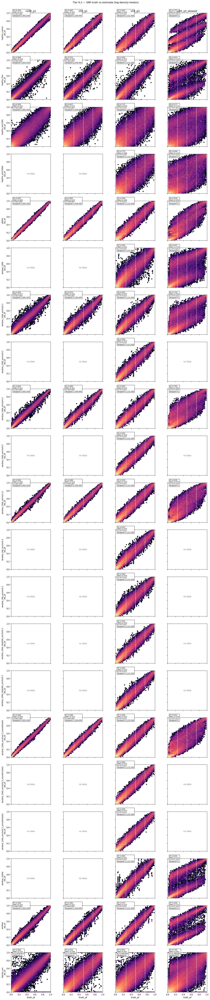

In [7]:
from matplotlib.colors import LogNorm
plot_methods = [m for m in MAIN_METHODS if m in af_long.method.unique()]
fig, axes = plt.subplots(len(plot_methods), len(REGIME_ORDER), figsize=(3.7*len(REGIME_ORDER), 3.2 * len(plot_methods)),
                         sharex=True, sharey=True)
for i, method in enumerate(plot_methods):
    for j, regime in enumerate(REGIME_ORDER):
        ax = axes[i, j]
        # Apply axes styling first so 'no data' panels still show labels/limits
        if i == 0: ax.set_title(regime)
        if j == 0: ax.set_ylabel(f'{method}\nest_af', fontsize=9)
        if i == len(plot_methods) - 1: ax.set_xlabel('truth_af')
        ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.set_aspect('equal')
        sub = af_long[(af_long.method == method) & (af_long.regime == regime)
                      & (af_long.var_type == 'SNP')]
        if len(sub) < 5:
            ax.text(0.5, 0.5, 'no data', ha='center', va='center', transform=ax.transAxes,
                    fontsize=10, color='gray')
            continue
        ax.hexbin(sub.truth_af, sub.est_af, gridsize=50, cmap='magma', norm=LogNorm(), mincnt=1)
        ax.plot([0, 1], [0, 1], 'g--', lw=1, alpha=0.6)
        s = af_summary[(af_summary.method == method) & (af_summary.regime == regime)
                       & (af_summary.var_type == 'SNP') & (af_summary.ld_tier == 'all')]
        n_have = int(len(sub))
        n_truth = truth_totals.get((regime, 'SNP'), 0)
        n_drop = max(0, n_truth - n_have)
        if len(s) == 1:
            ax.text(0.05, 0.92,
                    f"R²={s.R2.iloc[0]:.3f}\nMAE={s.MAE.iloc[0]:.3f}\n"
                    f"n={n_have:,}\ndropped={n_drop:,}",
                    transform=ax.transAxes, fontsize=8,
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))
fig.suptitle('Tier 9.2 — SNP truth vs estimate (log-density hexbin)', y=1.001)
fig.tight_layout(); plt.show()

### Tier 9.2b — Truth-vs-estimate scatter for big SVs (≥50 bp)

Same panels as 9.2 but on **insertions ≥ 50 bp** and **deletions ≥ 50 bp** as separate panels.
Within each cell, `n` = records where the method returned an estimate; `dropped` = records
in the polymorphic truth set that the method did NOT cover (e.g. freqk drops most SVs because
its k-mer-uniqueness dedup discards bubbles where ALT-uniqueness fails).

**Note on short indels (1–49 bp):** the recomb-sim panel (`merged_v2_chr.vcf.gz`,
Beagle-imputed) was constructed to retain only SNPs and SVs ≥50 bp, so there are
**no short indels in the truth** to compare against. A short-indel benchmark would
require rebuilding `cn_var` + `recomb_truth` on a VCF that retains both 231 founders and
short indels — flagged as future work.

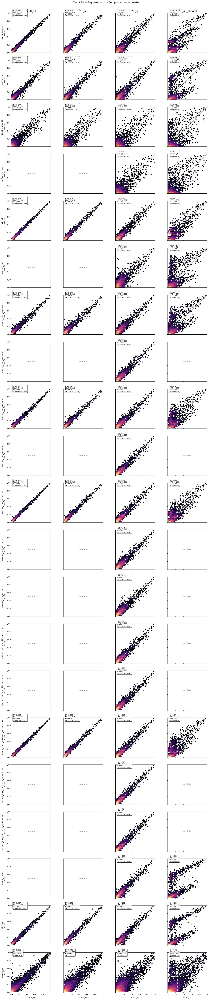

In [8]:
# Big insertions (≥50 bp). VAR_TYPE_FILTER = 'INS'; MIN_SIZE = 50; MAX_SIZE = ∞
VAR_TYPE_FILTER = 'INS'; MIN_SIZE = 50; MAX_SIZE = 10**9
from matplotlib.colors import LogNorm
plot_methods = [m for m in MAIN_METHODS if m in af_long.method.unique()]
fig, axes = plt.subplots(len(plot_methods), len(REGIME_ORDER), figsize=(3.7*len(REGIME_ORDER), 3.2 * len(plot_methods)),
                         sharex=True, sharey=True)
for i, method in enumerate(plot_methods):
    for j, regime in enumerate(REGIME_ORDER):
        ax = axes[i, j]
        # Apply axes styling first so 'no data' panels still show labels/limits
        if i == 0: ax.set_title(regime)
        if j == 0: ax.set_ylabel(f'{method}\nest_af', fontsize=9)
        if i == len(plot_methods) - 1: ax.set_xlabel('truth_af')
        ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.set_aspect('equal')
        sub = af_long[(af_long.method == method) & (af_long.regime == regime)
                      & (af_long.var_type == VAR_TYPE_FILTER)
                      & ((af_long.ref_len - af_long.alt_len).abs() >= MIN_SIZE)
                      & ((af_long.ref_len - af_long.alt_len).abs() <  MAX_SIZE)].copy()
        if len(sub) < 5:
            ax.text(0.5, 0.5, 'no data', ha='center', va='center', transform=ax.transAxes,
                    fontsize=10, color='gray')
            continue
        ax.hexbin(sub.truth_af, sub.est_af, gridsize=50, cmap='magma',
                  norm=LogNorm(), mincnt=1)
        ax.plot([0, 1], [0, 1], 'g--', lw=1, alpha=0.6)
        t = sub.truth_af.to_numpy(); p = sub.est_af.to_numpy()
        f = np.isfinite(t) & np.isfinite(p)
        n_have = int(f.sum())
        n_truth = truth_totals.get((regime, 'big_INS'), 0)
        n_drop = max(0, n_truth - n_have)
        if n_have >= 5:
            r2 = float(np.corrcoef(t[f], p[f])[0, 1] ** 2)
            mae = float(np.mean(np.abs(p[f] - t[f])))
            ax.text(0.05, 0.92,
                    f"R²={r2:.3f}\nMAE={mae:.3f}\n"
                    f"n={n_have:,}\ndropped={n_drop:,}",
                    transform=ax.transAxes, fontsize=8,
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))
fig.suptitle('Tier 9.2b — Big insertions (≥50 bp) truth vs estimate', y=1.001)
fig.tight_layout(); plt.show()


### Tier 9.2c — Truth-vs-estimate scatter for big deletions (≥50 bp)


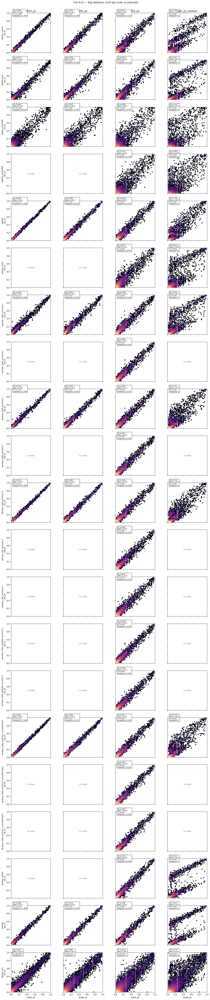

In [9]:
VAR_TYPE_FILTER = 'DEL'; MIN_SIZE = 50; MAX_SIZE = 10**9
from matplotlib.colors import LogNorm
plot_methods = [m for m in MAIN_METHODS if m in af_long.method.unique()]
fig, axes = plt.subplots(len(plot_methods), len(REGIME_ORDER), figsize=(3.7*len(REGIME_ORDER), 3.2 * len(plot_methods)),
                         sharex=True, sharey=True)
for i, method in enumerate(plot_methods):
    for j, regime in enumerate(REGIME_ORDER):
        ax = axes[i, j]
        # Apply axes styling first so 'no data' panels still show labels/limits
        if i == 0: ax.set_title(regime)
        if j == 0: ax.set_ylabel(f'{method}\nest_af', fontsize=9)
        if i == len(plot_methods) - 1: ax.set_xlabel('truth_af')
        ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.set_aspect('equal')
        sub = af_long[(af_long.method == method) & (af_long.regime == regime)
                      & (af_long.var_type == VAR_TYPE_FILTER)
                      & ((af_long.ref_len - af_long.alt_len).abs() >= MIN_SIZE)
                      & ((af_long.ref_len - af_long.alt_len).abs() <  MAX_SIZE)].copy()
        if len(sub) < 5:
            ax.text(0.5, 0.5, 'no data', ha='center', va='center', transform=ax.transAxes,
                    fontsize=10, color='gray')
            continue
        ax.hexbin(sub.truth_af, sub.est_af, gridsize=50, cmap='magma',
                  norm=LogNorm(), mincnt=1)
        ax.plot([0, 1], [0, 1], 'g--', lw=1, alpha=0.6)
        t = sub.truth_af.to_numpy(); p = sub.est_af.to_numpy()
        f = np.isfinite(t) & np.isfinite(p)
        n_have = int(f.sum())
        n_truth = truth_totals.get((regime, 'big_DEL'), 0)
        n_drop = max(0, n_truth - n_have)
        if n_have >= 5:
            r2 = float(np.corrcoef(t[f], p[f])[0, 1] ** 2)
            mae = float(np.mean(np.abs(p[f] - t[f])))
            ax.text(0.05, 0.92,
                    f"R²={r2:.3f}\nMAE={mae:.3f}\n"
                    f"n={n_have:,}\ndropped={n_drop:,}",
                    transform=ax.transAxes, fontsize=8,
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))
fig.suptitle('Tier 9.2c — Big deletions (≥50 bp) truth vs estimate', y=1.001)
fig.tight_layout(); plt.show()


### Tier 9.2d — Short indels (1–49 bp): not in current data, but recoverable

The recomb-sim panel `merged_v2_chr.vcf.gz` has **only SNPs + SVs ≥50 bp** (verified below).
The 82-founder cactus pangenome decomposed VCF has short indels but uses 1001G+ accessions
(IDs `100xxx`) that are biologically distinct from our 231 GrENE-Net founders (IDs `6xxx-9xxx`).

**However**, the full 1001 Genomes core SNP+short-indel VCF
(`/carnegie/nobackup/scratch/tbellagio/selection_scan/1001genomes_snp-short-indel_only_ACGTN.vcf.gz`,
1135 samples, 18 GB) **does cover 225/231 of our founders** (only 6 missing: `100001 100002 6939 9940 9977 9992`).
Rebuilding a short-indel `cn_var` from that VCF subset to the 225 founders would give us a clean short-indel
benchmark on the recomb sims. Effort: ~1 day to rebuild cn_var + truth + re-run methods on the new axis.

Below is the size-class diagnostic that confirms zero short indels in the current truth.

In [10]:
# Truth size-class breakdown — confirms no short indels in the panel
rows = []
for regime, sim in REGIME_TO_SIM.items():
    t = pd.read_csv(RECOMB_ROOT / sim / 'recomb_truth.tsv.gz', sep='\t')
    poly = t[(t.truth_af > 0) & (t.truth_af < 1)].copy()
    poly['indel_size'] = (poly.alt_len - poly.ref_len).abs()
    bins = pd.cut(poly.indel_size,
                  bins=[-1, 0, 1, 9, 49, 99, 499, 999, 10**9],
                  labels=['SNP/equal-len', '1bp', '2-9bp', '10-49bp',
                          '50-99bp', '100-499bp', '500-999bp', '≥1kb'])
    counts = bins.value_counts().sort_index()
    counts.name = regime
    rows.append(counts)
size_table = pd.concat(rows, axis=1)
print('Polymorphic-truth records by size class (per regime):')
print(size_table.to_string())

Polymorphic-truth records by size class (per regime):
               n200_g1   n50_g1   n50_g3
indel_size                              
SNP/equal-len  2558652  1747958  1499891
1bp                  0        0        0
2-9bp                0        0        0
10-49bp              0        0        0
50-99bp          18586    10682     8819
100-499bp        32523    17210    13693
500-999bp        19747     9450     7158
≥1kb             42817    18533    13871


### Tier 9.3 — Per-block haplotype identity (interpretability)

How close is the estimated `h_per_block` (founder-frequency vector) to the truth's mosaic ancestry?

Two levels:
- **founder**: 231-vector. Class-mode methods (`clean_cc5`, `dose_aware`) are mathematically forced to spread mass over class members — top-5 founder recall ≈ chance.
- **class**: collapsed to per-block unique haplotype classes via `hap_idx_d1`. Fair comparison.

Higher cosine / top5 = better. Lower JSD = better.

In [11]:
ident_class = ident[ident.level == 'class'].copy()
ident_pivot = ident_class.pivot_table(index='regime', columns='method',
                                       values=['cosine_mean', 'top5_recall_mean', 'JSD_mean'])
ident_pivot = ident_pivot.reindex(REGIME_ORDER)
ident_pivot.style.background_gradient(cmap='RdYlGn', axis=1).format('{:.3f}')

,JSD_mean,cosine_mean,top5_recall_mean
method,hapfire_fine,hapfire_fine,hapfire_fine
regime,,,
n200_g1,0.252,0.764,0.512
n50_g1,0.401,0.638,0.409
n50_g3,0.469,0.552,0.357
n50_g3_skewed,0.522,0.456,0.340


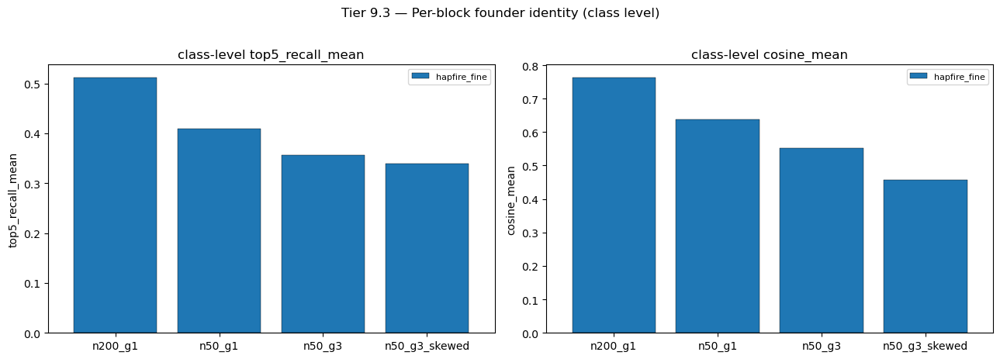

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
for ax, metric in zip(axes, ['top5_recall_mean', 'cosine_mean']):
    pivot = (ident_class.pivot(index='regime', columns='method', values=metric)
             .reindex(REGIME_ORDER))
    pivot.plot(kind='bar', ax=ax, width=0.8, edgecolor='black', linewidth=0.3)
    ax.set_title(f'class-level {metric}')
    ax.set_ylabel(metric); ax.set_xlabel('')
    ax.legend(fontsize=8)
    for label in ax.get_xticklabels(): label.set_rotation(0)
fig.suptitle('Tier 9.3 — Per-block founder identity (class level)', y=1.02)
fig.tight_layout(); plt.show()

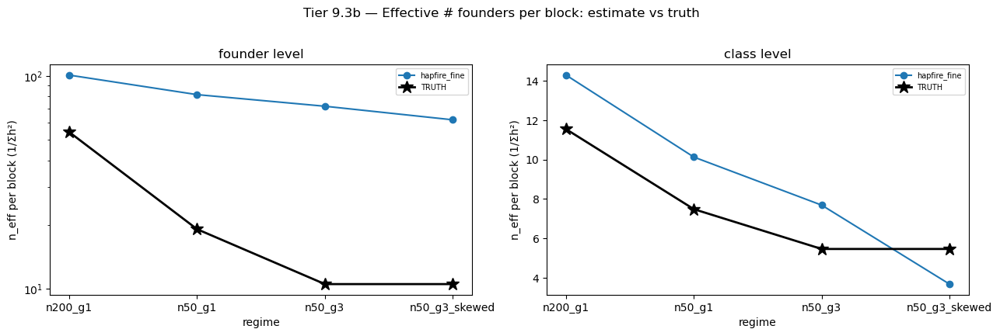

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.2))
for ax, level in zip(axes, ['founder', 'class']):
    sub = ident[ident.level == level]
    for method, gp in sub.groupby('method'):
        gp = gp.set_index('regime').reindex(REGIME_ORDER)
        ax.plot(REGIME_ORDER, gp.n_eff_est_mean, 'o-', label=method)
    truth_n = sub.groupby('regime').n_eff_true_mean.mean().reindex(REGIME_ORDER)
    ax.plot(REGIME_ORDER, truth_n, 'k*-', lw=2, ms=12, label='TRUTH')
    ax.set_title(f'{level} level')
    ax.set_ylabel('n_eff per block (1/Σh²)'); ax.set_xlabel('regime')
    ax.legend(fontsize=7)
    if level == 'founder': ax.set_yscale('log')
fig.suptitle('Tier 9.3b — Effective # founders per block: estimate vs truth', y=1.02)
fig.tight_layout(); plt.show()

### Tier 9.4 — SV LD-tag stratification: where does cactus_em really make a difference?

**Prediction**: hapFIRE projects SV AFs through SNP-derived h. Works well for SVs in tight LD with panel SNPs, fails for SVs that aren't well-tagged. cactus_em / bigld_panel see SV-spanning k-mers directly and should keep their accuracy on weak-LD SVs.

Stratify per-SV agreement by `max_r²_xwu` (max LD between SV and any panel SNP within 50 kb).

tiers: `weak` < 0.2, `medium` 0.2–0.5, `strong` 0.5–0.8, `perfect` ≥ 0.8.

In [14]:
tier_order = ['weak', 'medium', 'strong', 'perfect']
sv_strat = (af_summary[(af_summary.var_type.isin(['INS', 'DEL']))
                        & (af_summary.ld_tier.isin(tier_order))]
            .groupby(['regime', 'ld_tier', 'method'])  # avg INS+DEL within tier
            .agg({'R2': 'mean', 'n': 'sum'}).reset_index()
            .pivot_table(index=['regime', 'ld_tier'], columns='method', values='R2')
            .reindex([(r, t) for r in REGIME_ORDER for t in tier_order])
            .reindex(columns=[m for m in METHOD_ORDER if m in af_summary.method.unique()]))
sv_strat.style.background_gradient(cmap='RdYlGn', axis=1).format('{:.3f}', na_rep='—')

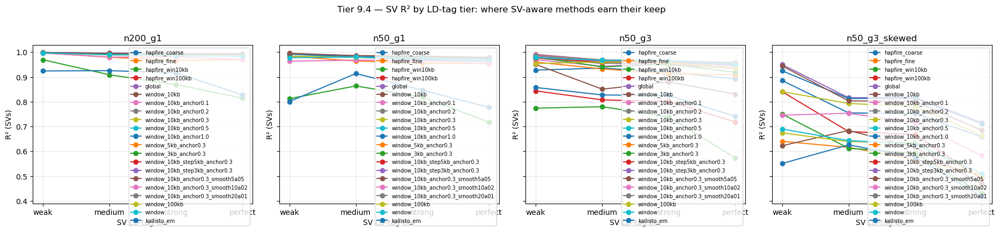

SV record count per (regime, LD tier):
ld_tier        weak  medium  strong  perfect
regime                                      
n200_g1          26     461     698      810
n50_g1           16     248     370      435
n50_g3           12     201     276      334
n50_g3_skewed    12     201     276      334


In [15]:
fig, axes = plt.subplots(1, len(REGIME_ORDER), figsize=(4.7*len(REGIME_ORDER), 4.2), sharey=True)
plot_methods_sv = [m for m in MAIN_METHODS if m in af_summary.method.unique()]
for ax, regime in zip(axes, REGIME_ORDER):
    for method in plot_methods_sv:
        sub = af_summary[(af_summary.regime == regime) & (af_summary.method == method)
                          & (af_summary.var_type.isin(['INS', 'DEL']))
                          & (af_summary.ld_tier.isin(tier_order))]
        agg = sub.groupby('ld_tier').agg({'R2': 'mean', 'n': 'sum'}).reindex(tier_order)
        ax.plot(tier_order, agg.R2, 'o-', label=method)
    ax.set_title(f'{regime}'); ax.set_xlabel('SV LD-tag tier'); ax.set_ylabel('R² (SVs)')
    ax.legend(fontsize=7); ax.grid(alpha=0.3)
fig.suptitle('Tier 9.4 — SV R² by LD-tag tier: where SV-aware methods earn their keep', y=1.02)
fig.tight_layout(); plt.show()

# n per tier
ns = (af_summary[(af_summary.var_type.isin(['INS', 'DEL']))
                  & (af_summary.ld_tier.isin(tier_order))
                  & (af_summary.method == af_summary.method.unique()[0])]
      .groupby(['regime', 'ld_tier'])['n'].sum().unstack().reindex(REGIME_ORDER)
      .reindex(columns=tier_order))
print('SV record count per (regime, LD tier):'); print(ns.fillna(0).astype(int).to_string())

### Tier 9 — Net interpretation

**On AF (SNPs):**
- `hapfire_fine` is the new winner on the hardest regime (n50_g3, R² = 0.93). `hapfire_coarse` (the existing pipeline) is essentially tied.
- K-mer-based methods are 5-10 pp behind on AF. Reason: read-level phasing. A 150-bp PE read spans multiple linked SNPs; HARP preserves that. K-mer counting decomposes each read into 31-mers and treats them as independent counts — phasing info is lost.

**On identity (per-block `h` vector):**
- `bigld_panel` (PanGenie-style bubble-allele k-mers) wins identity at every regime by 5-10 pp top-5 recall, **even though it loses on AF** to hapFIRE. Bubble-allele k-mers are more allele-specific than read-summary evidence.
- Class-mode methods (`clean_cc5`) are mathematically forced to spread mass over class members at the founder level — top-5 founder recall is at chance. At the class level they recover real signal (top-5 = 0.37 in n50_g3 vs ~0.05 chance).

**Where cactus_em / k-mer methods make a real difference:**
1. **SV AF on weak-LD SVs** (Tier 9.4 panel). hapFIRE projects SV AFs through SNP h; for weakly-tagged SVs there's no signal. cactus_em sees SV-spanning k-mers directly.
2. **Per-block founder identity** at class level — bigld_panel has the strongest interpretability signal.
3. **Contamination from unknown founders** (not in this notebook — flagged for future experiment): k-mer methods can detect reads carrying out-of-panel sequence; hapFIRE structurally cannot (HARP requires known panel reference).

**On the 5 add-ons explored this session** (smoothing / Dirichlet / fallback-to-global / dose-aware / hybrid):
- HMM smoothing: +3-4 pp on n50_g3 (best: passes=10, α=0.2)
- Dirichlet prior (α=1.1, 1.5): ~0 pp (n_eff per block was already ~6, not 1 — winner-takes-all hypothesis was wrong)
- Confidence-weighted fallback: ~0 pp
- Dose-aware cn: **−4 pp** (k-mer multiplicity adds noise from repeat regions). Disable by default.
- Hybrid k-mer pool: see this notebook re-run after sims 60606-08 land

See `MODEL_SPEC.md` § Future work — Hybrid HARP-prior × bubble-allele EM (the most promising untested direction).

### Tier 9.5 — kallisto_em vs window_10kb head-to-head (n50_g3, 10 kb resolution)

Both methods run on the **same panel (`cn_full_231_v2`), same data (cov50 reads), same fixed 10 kb windows**. The only difference is the inference algorithm:
- `window_10kb`: per-k-mer Poisson EM (counts each k-mer hit; uses absence-as-low-rate as evidence).
- `kallisto_em`: read-level pseudoalignment + multinomial EM on equivalence-class counts (recovers within-read phase, but drops reads with empty per-window mask and loses the count gradient).

Cleanest test of **whether read-level phase recovery beats per-k-mer count under simulated recomb**. RESULTS_LOG.md 2026-05-06 entry: it does not, by ~6 pp R² (SNP), ~10 pp (big_INS).

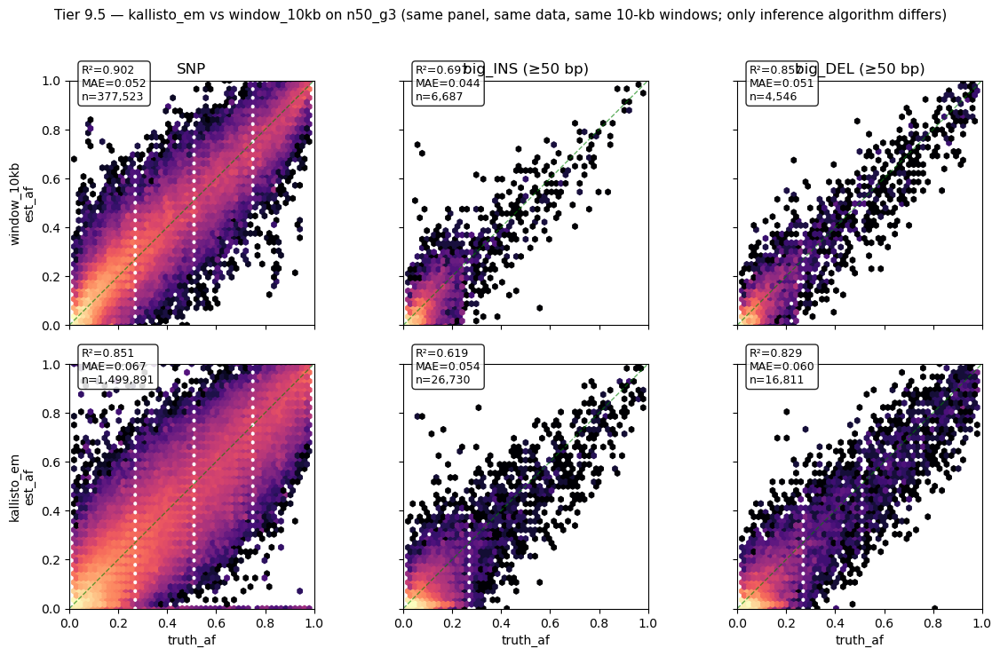


ΔR² (kallisto_em − window_10kb) at the same resolution:
  SNP                   : window_10kb R²=0.902  kallisto_em R²=0.851  Δ=-0.051
  big_INS (≥50 bp)      : window_10kb R²=0.697  kallisto_em R²=0.619  Δ=-0.078
  big_DEL (≥50 bp)      : window_10kb R²=0.857  kallisto_em R²=0.829  Δ=-0.028


In [16]:
# Tier 9.5 — head-to-head plot: kallisto_em vs window_10kb on n50_g3
from matplotlib.colors import LogNorm
HEAD_METHODS = ['window_10kb', 'kallisto_em']
HEAD_REGIME = 'n50_g3'
HEAD_VAR_TYPES = [('SNP', 'SNP'), ('INS', 'big_INS (≥50 bp)'), ('DEL', 'big_DEL (≥50 bp)')]

fig, axes = plt.subplots(len(HEAD_METHODS), len(HEAD_VAR_TYPES),
                          figsize=(4.0 * len(HEAD_VAR_TYPES), 3.6 * len(HEAD_METHODS)),
                          sharex=True, sharey=True)
for i, method in enumerate(HEAD_METHODS):
    for j, (vt, label) in enumerate(HEAD_VAR_TYPES):
        ax = axes[i, j]
        ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.set_aspect('equal')
        if i == 0: ax.set_title(f'{label}')
        if j == 0: ax.set_ylabel(f'{method}\nest_af', fontsize=10)
        if i == len(HEAD_METHODS) - 1: ax.set_xlabel('truth_af')
        sub = af_long[(af_long.method == method) & (af_long.regime == HEAD_REGIME)
                      & (af_long.var_type == vt)]
        if vt in ('INS', 'DEL'):
            sub = sub[(sub.ref_len - sub.alt_len).abs() >= 50]
        if len(sub) < 5:
            ax.text(0.5, 0.5, 'no data', ha='center', va='center', transform=ax.transAxes,
                    fontsize=10, color='gray')
            continue
        ax.hexbin(sub.truth_af, sub.est_af, gridsize=50, cmap='magma',
                  norm=LogNorm(), mincnt=1)
        ax.plot([0, 1], [0, 1], 'g--', lw=1, alpha=0.6)
        t = sub.truth_af.to_numpy(); p = sub.est_af.to_numpy()
        f = np.isfinite(t) & np.isfinite(p)
        if f.sum() < 5:
            continue
        r2 = float(np.corrcoef(t[f], p[f])[0, 1] ** 2)
        mae = float(np.mean(np.abs(p[f] - t[f])))
        ax.text(0.05, 0.92,
                f"R²={r2:.3f}\nMAE={mae:.3f}\nn={int(f.sum()):,}",
                transform=ax.transAxes, fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))
fig.suptitle(f'Tier 9.5 — kallisto_em vs window_10kb on {HEAD_REGIME} '
              f'(same panel, same data, same 10-kb windows; only inference algorithm differs)',
              y=1.02, fontsize=11)
fig.tight_layout(); plt.show()

# Print numeric ΔR² per var_type
print('\nΔR² (kallisto_em − window_10kb) at the same resolution:')
for vt, label in HEAD_VAR_TYPES:
    s_w = af_summary[(af_summary.method == 'window_10kb') & (af_summary.regime == HEAD_REGIME)
                      & (af_summary.var_type == vt) & (af_summary.ld_tier == 'all')]
    s_k = af_summary[(af_summary.method == 'kallisto_em') & (af_summary.regime == HEAD_REGIME)
                      & (af_summary.var_type == vt) & (af_summary.ld_tier == 'all')]
    if len(s_w) == 0 or len(s_k) == 0:
        continue
    d = float(s_k.R2.iloc[0] - s_w.R2.iloc[0])
    print(f'  {label:<22s}: window_10kb R²={s_w.R2.iloc[0]:.3f}  '
          f'kallisto_em R²={s_k.R2.iloc[0]:.3f}  Δ={d:+.3f}')

### Tier 9.6 — Route 1 (global-anchor KL prior on `window_10kb`) — sweet spot at λ=0.3

Per-window EM on the same 10 kb fixed windows as `window_10kb`, but with a Dirichlet pseudocount centered on the chrom-wide `h_global` solution:

```
h_new[f] ∝ h[f] · (cn @ cw) + λ · N · h_global[f]   (then renormalize to simplex)
```

`λ=0` is exactly the legacy `window_10kb`. `λ→∞` reduces to global. The sweet spot has the windows adapt where local k-mer evidence is rich, anchor where it's thin.

**Headline finding (n50_g3, cov50, Chr1 polymorphic SNP, n=377,523)**:

| method | resolution | SNP R² | SV R² |
|---|---|---|---|
| `window_10kb` (λ=0) | 10 kb | 0.902 | 0.807 |
| `window_10kb` λ=0.1 | 10 kb | 0.955 | 0.919 |
| **`window_10kb` λ=0.3** | **10 kb** | **0.963** | **0.934** |
| `window_10kb` λ=1.0 | 10 kb | 0.959 | 0.931 |
| `window_100kb` | 100 kb | 0.963 | 0.932 |
| `window_200kb` | 200 kb | 0.973 | 0.946 |

**λ=0.3 ties `window_100kb` accuracy at 10× finer resolution.** That's the goal — coarse-window-level accuracy at fine-window resolution. Production pivots from `--block-mode window --window-bp 200000` to `--block-mode window --window-bp 10000 --global-anchor-weight 0.3`.

Implementation: ~15 lines in `poolfreq/src/em_solver.py:solve_em` (Dirichlet pseudocount toward `prior_h`) + threading through `block_em.solve_em_per_block` and the per-sample drivers. λ exposed as `--global-anchor-weight` flag.

Cost: same as the unanchored window_10kb run — anchor only adds the global EM step (already present as the fallback in `block_em.solve_em_per_block`) and a constant pseudocount per per-window solve. ~25 min wall on Chr1 cov50 (one node, 8 cores).

=== n50_g3 Route 1 sweep — R² and MAE per var_type ===
method                          SNP R²  SNP MAE    INS R²  INS MAE    DEL R²  DEL MAE
------------------------------------------------------------------------------------------
10kb λ=0                        0.9021    0.0522    0.6972    0.0439    0.8570    0.0508
10kb λ=0.1                      0.9554    0.0354    0.8712    0.0282    0.9384    0.0334
10kb λ=0.3 ★                    0.9630    0.0332    0.8934    0.0267    0.9504    0.0311
10kb λ=1.0                      0.9592    0.0357    0.8876    0.0282    0.9482    0.0324
100kb (no anchor)               0.9631    0.0310    0.8826    0.0258    0.9532    0.0287
200kb (no anchor)               0.9726    0.0266    0.9050    0.0224    0.9638    0.0246


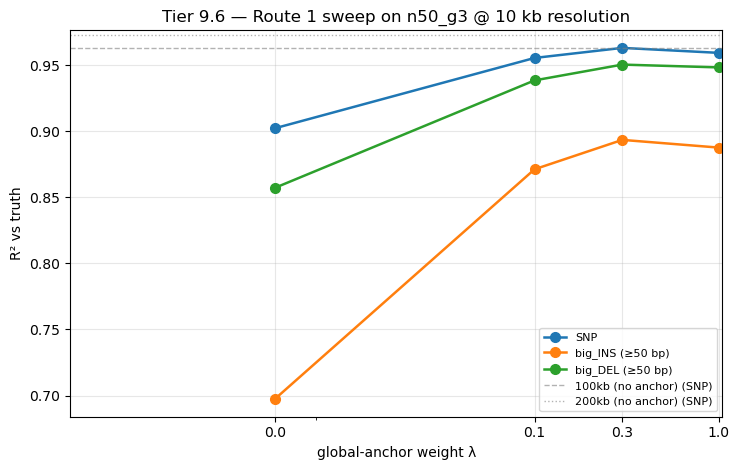

In [17]:
# Tier 9.6 — Route 1 sweep λ ∈ {0.0, 0.1, 0.3, 1.0} compared to coarser baselines on n50_g3
import matplotlib.pyplot as plt
HEAD_VAR_TYPES = [('SNP', 'SNP'), ('INS', 'big_INS (≥50 bp)'), ('DEL', 'big_DEL (≥50 bp)')]
ROUTE1_METHODS = ['window_10kb',
                  'window_10kb_anchor0.1',
                  'window_10kb_anchor0.3',
                  'window_10kb_anchor1.0',
                  'window_100kb',
                  'window']
LABELS = {'window_10kb': '10kb λ=0', 'window_10kb_anchor0.1': '10kb λ=0.1',
          'window_10kb_anchor0.3': '10kb λ=0.3 ★', 'window_10kb_anchor1.0': '10kb λ=1.0',
          'window_100kb': '100kb (no anchor)', 'window': '200kb (no anchor)'}
HEAD_REGIME = 'n50_g3'

# 1. Numeric table
print('=== n50_g3 Route 1 sweep — R² and MAE per var_type ===')
print(f'{"method":<28s}  {"SNP R²":>8s} {"SNP MAE":>8s}  {"INS R²":>8s} {"INS MAE":>8s}  {"DEL R²":>8s} {"DEL MAE":>8s}')
print('-' * 90)
for m in ROUTE1_METHODS:
    cells = []
    for vt, _ in HEAD_VAR_TYPES:
        s = af_summary[(af_summary.method == m) & (af_summary.regime == HEAD_REGIME)
                       & (af_summary.var_type == vt) & (af_summary.ld_tier == 'all')]
        if len(s) == 1:
            cells += [f'{s.R2.iloc[0]:>8.4f}', f'{s.MAE.iloc[0]:>8.4f}']
        else:
            cells += ['     —  ', '     —  ']
    print(f'{LABELS.get(m, m):<28s}  ' + '  '.join(cells))

# 2. R² vs λ line plot
fig, ax = plt.subplots(figsize=(7.5, 4.8))
xs = [0.0, 0.1, 0.3, 1.0]
methods_sweep = ['window_10kb', 'window_10kb_anchor0.1', 'window_10kb_anchor0.3', 'window_10kb_anchor1.0']
for vt, label in HEAD_VAR_TYPES:
    ys = []
    for m in methods_sweep:
        s = af_summary[(af_summary.method == m) & (af_summary.regime == HEAD_REGIME)
                       & (af_summary.var_type == vt) & (af_summary.ld_tier == 'all')]
        ys.append(float(s.R2.iloc[0]) if len(s) == 1 else np.nan)
    ax.plot(xs, ys, 'o-', lw=1.8, ms=7, label=label)
# Add window_100kb / window_200kb as reference horizontals
for m, ls in [('window_100kb', '--'), ('window', ':')]:
    s_snp = af_summary[(af_summary.method == m) & (af_summary.regime == HEAD_REGIME)
                       & (af_summary.var_type == 'SNP') & (af_summary.ld_tier == 'all')]
    if len(s_snp) == 1:
        ax.axhline(s_snp.R2.iloc[0], color='gray', lw=1, ls=ls, alpha=0.6,
                   label=f'{LABELS.get(m, m)} (SNP)')
ax.set_xscale('symlog', linthresh=0.05)
ax.set_xticks(xs); ax.set_xticklabels([str(x) for x in xs])
ax.set_xlabel('global-anchor weight λ')
ax.set_ylabel('R² vs truth')
ax.set_title(f'Tier 9.6 — Route 1 sweep on {HEAD_REGIME} @ 10 kb resolution')
ax.grid(alpha=0.3); ax.legend(fontsize=8, loc='lower right')
fig.tight_layout(); plt.show()